# Load Libraries

In [6]:

import pandas as pd
import numpy as np
import seaborn as sns

from scipy.stats import chi2_contingency
from scipy.stats import pearsonr
from scipy.stats import ttest_ind, ttest_ind_from_stats
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import statsmodels.api as sm
from sklearn.utils.class_weight import compute_class_weight
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from sklearn.model_selection import cross_val_score
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier, plot_tree
import matplotlib.pyplot as plt

In [ ]:
#merging the two files patient data and Ward-Deprivation-Scores
import pandas as pd

Data_file1 = '/Users/hajarouagar/Downloads/patient_data.xlsx'
df1 = pd.read_excel(Data_file1)

Data_file2 = '/Users/hajarouagar/Downloads/assessment-data/Ward-Deprivation-Scores.xlsx'
df2 = pd.read_excel(Data_file2)


# Merge the two DataFrames based on a common column (e.g., 'common_column')
merged_df = pd.merge(df1, df2, on='Ward Code', how='inner')  # 'inner' means keep only the common rows

# Save the merged DataFrame to a new Excel file
merged_df.to_excel('/Users/hajarouagar/Downloads/data_merged_job_task.xlsx', index=False)

In [7]:
# Read data from Excel file
Data_file = '/Users/hajarouagar/Downloads/patient_data.xlsx'
sheet_name = 'data'  
df = pd.read_excel(Data_file, sheet_name=sheet_name)

# Check for missing values and print column names
missing_values = df.isnull().sum()

# Print the missing values with column names
print("Missing Values:")
for column, count in missing_values.items():
    if count > 0:
        print(f"{column}: {count} missing values")

# Alternatively, you can check for any missing values in the entire DataFrame
if df.isnull().values.any():
    print("There are missing values in the DataFrame.")
else:
    print("No missing values found in the DataFrame.")

Missing Values:
Ethnicity: 2454 missing values
There are missing values in the DataFrame.


In [8]:
# Load Data Set
Data_file = '/Users/hajarouagar/Downloads/patient_data.xlsx'
df = pd.read_excel(Data_file)

Basic Statistics:
                Age  BMI (kg/m^2)    sex coding  ethnicity coding  \
count  28905.000000  28905.000000  28905.000000      28905.000000   
mean      56.172980     27.079343      0.531050          1.762359   
std        9.687665      6.434368      0.536528          1.130079   
min       25.000000      6.900000      0.000000          0.000000   
25%       48.000000     22.700000      0.000000          1.000000   
50%       56.000000     27.100000      1.000000          2.000000   
75%       65.000000     31.400000      1.000000          3.000000   
max       73.000000     55.100000      2.000000          3.000000   

       Probabilities  Unnamed: 11  Unnamed: 12  Unnamed: 13  Unnamed: 14  \
count   28905.000000          0.0          0.0          0.0          0.0   
mean        0.116983          NaN          NaN          NaN          NaN   
std         0.046663          NaN          NaN          NaN          NaN   
min         0.028339          NaN          NaN          

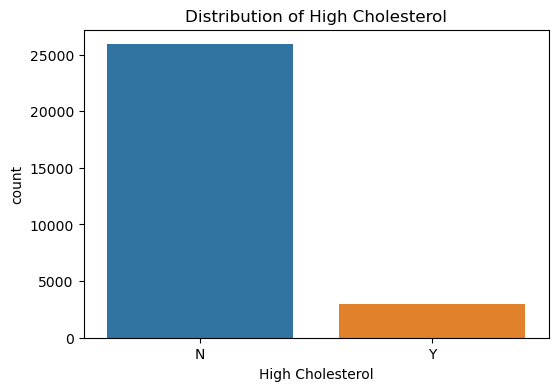

/Users/hajarouagar/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1200x800 with 0 Axes>

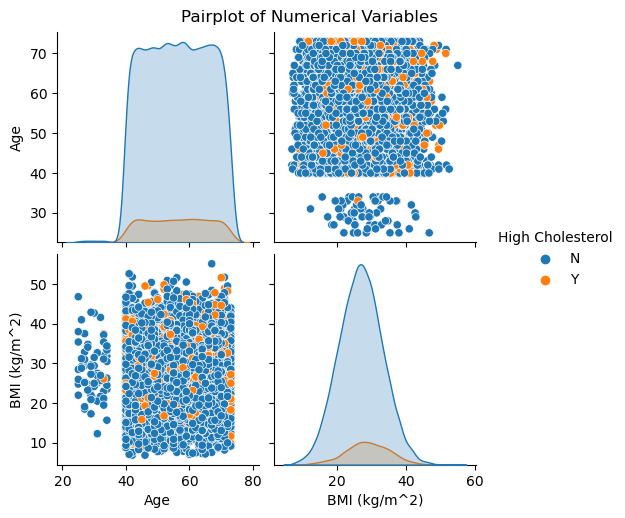

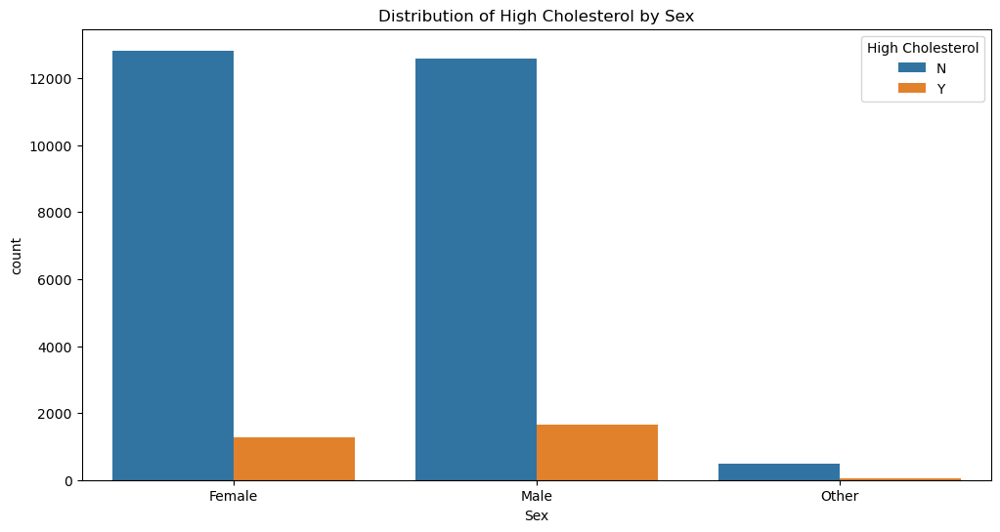

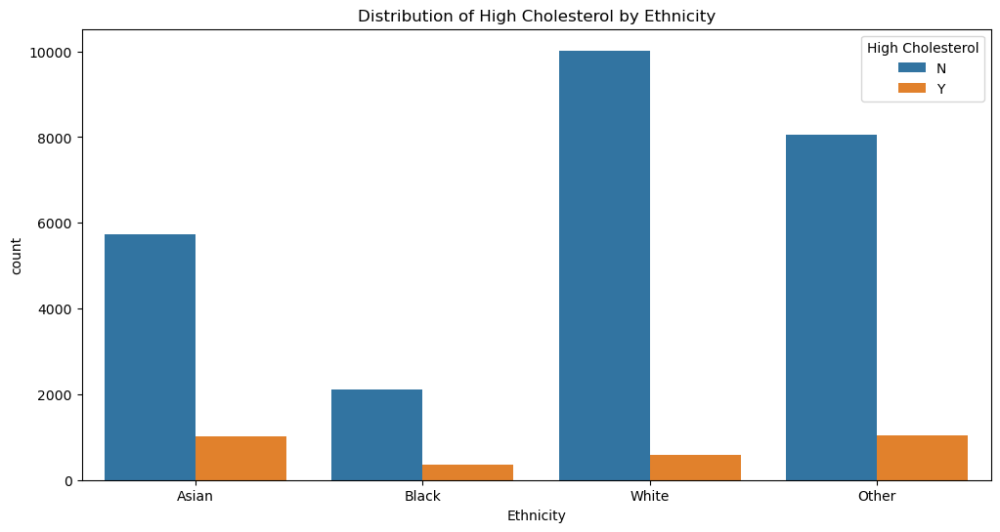

In [9]:
# Exploratory Data Analysis (EDA)
# Display basic statistics
print("Basic Statistics:")
print(df.describe())

# Check for missing values
print("Missing Values:")
print(df.isnull().sum())

# Visualize the distribution of the target variable
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 4))
sns.countplot(x='High Cholesterol', data=df)
plt.title('Distribution of High Cholesterol')
plt.show()

# Explore the distribution of numerical variables
plt.figure(figsize=(12, 8))
sns.pairplot(df[['Age', 'BMI (kg/m^2)', 'High Cholesterol']], hue='High Cholesterol', diag_kind='kde')
plt.suptitle('Pairplot of Numerical Variables', y=1.02)
plt.show()

# Explore the distribution of categorical variables
plt.figure(figsize=(12, 6))
sns.countplot(x='Sex', hue='High Cholesterol', data=df)
plt.title('Distribution of High Cholesterol by Sex')
plt.show()

plt.figure(figsize=(12, 6))
sns.countplot(x='Ethnicity', hue='High Cholesterol', data=df)
plt.title('Distribution of High Cholesterol by Ethnicity')
plt.show()

In [10]:
# Check the correlation between Age and BMI
correlation, p_value = pearsonr(df['Age'], df['BMI (kg/m^2)'])

# Print the results
print(f"Pearson Correlation Coefficient: {correlation}")
print(f"P-value: {p_value}")

# Interpret the results
alpha = 0.05  # Set your significance level
if p_value < alpha:
    print("There is a significant correlation between Age and BMI.")
else:
    print("There is no significant correlation between Age and BMI.")


Pearson Correlation Coefficient: -0.00018449965126599607
P-value: 0.9749774185617619
There is no significant correlation between Age and BMI.


In [11]:
# Convert 'High Cholesterol' to numerical using label encoding
label_encoder = LabelEncoder()
df['High Cholesterol'] = label_encoder.fit_transform(df['High Cholesterol'])

# Check the correlation between High Cholesterol and BMI
correlation, p_value = pearsonr(df['High Cholesterol'], df['BMI (kg/m^2)'])

# Print the results
print(f"Pearson Correlation Coefficient: {correlation}")
print(f"P-value: {p_value}")

# Interpret the results
alpha = 0.05  # Set your significance level
if p_value < alpha:
    print("There is a significant correlation between High Cholesterol and BMI.")
else:
    print("There is no significant correlation between High Cholesterol and BMI.")

Pearson Correlation Coefficient: 0.0937492373985408
P-value: 1.962955142178684e-57
There is a significant correlation between High Cholesterol and BMI.


In [12]:
# Create a contingency table for 'Sex' and 'High Cholesterol'
contingency_table = pd.crosstab(df['Sex'], df['High Cholesterol'])

# Perform the Chi-square test
chi2, p_value, _, _ = chi2_contingency(contingency_table)

# Print the results
print(f"Chi-square statistic: {chi2}")
print(f"P-value: {p_value}")

# Interpret the results
alpha = 0.05  # Set your significance level
if p_value < alpha:
    print("There is a significant association between Sex and High Cholesterol.")
else:
    print("There is no significant association between Sex and High Cholesterol.")

Chi-square statistic: 47.80441661040686
P-value: 4.162965653386101e-11
There is a significant association between Sex and High Cholesterol.


In [13]:
# Convert 'Sex' to numerical using label encoding
label_encoder = LabelEncoder()
df['Sex'] = label_encoder.fit_transform(df['Sex'])

# Separate 'BMI' values for Male and Female groups
male_bmi = df[df['Sex'] == 0]['BMI (kg/m^2)']
female_bmi = df[df['Sex'] == 1]['BMI (kg/m^2)']

# Perform independent t-test
t_stat, p_value = ttest_ind(male_bmi, female_bmi, equal_var=False)

# Print the results
print(f"T-statistic: {t_stat}")
print(f"P-value: {p_value}")

# Interpret the results
alpha = 0.05  # Set your significance level
if p_value < alpha:
    print("There is a significant difference in the mean BMI between Male and Female groups.")
else:
    print("There is no significant difference in the mean BMI between Male and Female groups.")

T-statistic: -0.1268102043587457
P-value: 0.8990915187749688
There is no significant difference in the mean BMI between Male and Female groups.


In [14]:
# Create a contingency table for 'Ethnicity' and 'BMI' categories
contingency_table = pd.crosstab(df['Ethnicity'], pd.cut(df['BMI (kg/m^2)'], bins=3, labels=["Low", "Medium", "High"]))

# Perform the Chi-square test
chi2_stat, p_value_chi2, _, _ = chi2_contingency(contingency_table)

# Print chi-square test results
print(f"Chi-square statistic: {chi2_stat}")
print(f"P-value (Chi-square): {p_value_chi2}")

# Interpret the chi-square test results
alpha_chi2 = 0.05  # Set your significance level for chi-square
if p_value_chi2 < alpha_chi2:
    print("There is a significant association between Ethnicity and BMI categories.")
else:
    print("There is no significant association between Ethnicity and BMI categories.")

Chi-square statistic: 3.480462043911649
P-value (Chi-square): 0.7465672959089695
There is no significant association between Ethnicity and BMI categories.


In [15]:

# Create a contingency table for 'Ethnicity' and 'High Cholesterol'
contingency_table = pd.crosstab(df['Ethnicity'], df['High Cholesterol'])

# Perform the Chi-square test
chi2, p_value, _, _ = chi2_contingency(contingency_table)

# Print the results
print(f"Chi-square statistic: {chi2}")
print(f"P-value: {p_value}")

# Interpret the results
alpha = 0.05  # Set your significance level
if p_value < alpha:
    print("There is a significant association between Ethnicity and High Cholesterol.")
else:
    print("There is no significant association between Ethnicity and High Cholesterol.")


Chi-square statistic: 493.17410062637333
P-value: 1.4385431068520623e-106
There is a significant association between Ethnicity and High Cholesterol.


In [46]:
import pandas as pd
from scipy.stats import chi2_contingency

Data_file = '/Users/hajarouagar/Downloads/patient_data.xlsx'
sheet_name = 'data'  
df = pd.read_excel(Data_file, sheet_name=sheet_name)

# Filter the data for males and females
male_data = df[df['Sex'] == 'Male']
female_data = df[df['Sex'] == 'Female']

# Create contingency tables for High Cholesterol by Sex
contingency_table_male = pd.crosstab(male_data['High Cholesterol'], male_data['Sex'])
contingency_table_female = pd.crosstab(female_data['High Cholesterol'], female_data['Sex'])

# Perform a chi-square test for independence for males
if contingency_table_male.size > 0:
    chi2_male, p_male, _, _ = chi2_contingency(contingency_table_male)
    print("Results for Males:")
    print(f"Chi-squared statistic: {chi2_male}")
    print(f"P-value: {p_male}")
    if p_male < alpha:
        print("There is a significant association between High Cholesterol andm ales.")
    else:
        print("There is no significant association between High Cholesterol and males.")
else:
    print("No data available for males.")

# Perform a chi-square test for independence for females
if contingency_table_female.size > 0:
    chi2_female, p_female, _, _ = chi2_contingency(contingency_table_female)
    print("\nResults for Females:")
    print(f"Chi-squared statistic: {chi2_female}")
    print(f"P-value: {p_female}")
    if p_female < alpha:
        print("There is a significant association between High Cholesterol and females.")
    else:
        print("There is no significant association between High Cholesterol and females.")
else:
    print("No data available for females.")

Results for Males:
Chi-squared statistic: 0.0
P-value: 1.0
There is no significant association between High Cholesterol and males.

Results for Females:
Chi-squared statistic: 0.0
P-value: 1.0
There is no significant association between High Cholesterol and females.


In [18]:
import pandas as pd
from scipy import stats

Data_file = '/Users/hajarouagar/Downloads/data_merged_job_task.xlsx'
dfmerged = pd.read_excel(Data_file)

# Filter data for Birmingham and Solihull based on Local Authority District code
birmingham_data = dfmerged[dfmerged['Local Authority District code (2019)'] == 'E08000025']
solihull_data = dfmerged[dfmerged['Local Authority District code (2019)'] == 'E08000029']

# Define the variables of interest
bmi_birmingham = birmingham_data['BMI (kg/m^2)']
bmi_solihull = solihull_data['BMI (kg/m^2)']

# Perform a t-test for the average BMI
t_stat, p_value = stats.ttest_ind(bmi_birmingham, bmi_solihull)

# Print the results
print(f"T-statistic: {t_stat}")
print(f"P-value: {p_value}")

# Determine the significance based on the p-value
alpha = 0.05  # Set your significance level
if p_value < alpha:
    print("There is a significant difference in the average BMI between Birmingham and Solihull.")
else:
    print("There is no significant difference in the average BMI between Birmingham and Solihull.")

T-statistic: -0.2162596371456848
P-value: 0.8287868956589148
There is no significant difference in the average BMI between Birmingham and Solihull.


In [19]:
# Define the variables of interest (IMD Quintile)
imd_birmingham = birmingham_data['IMD Quintile']
imd_solihull = solihull_data['IMD Quintile']

# Perform a t-test for the average IMD Quintile
t_stat, p_value = stats.ttest_ind(imd_birmingham, imd_solihull)

# Print the results
print(f"T-statistic: {t_stat}")
print(f"P-value: {p_value}")

# Determine the significance based on the p-value
alpha = 0.05  # Set your significance level
if p_value < alpha:
    print("There is a significant difference in the average IMD Quintile between Birmingham and Solihull.")
else:
    print("There is no significant difference in the average IMD Quintile between Birmingham and Solihull.")

T-statistic: -86.0105170867609
P-value: 0.0
There is a significant difference in the average IMD Quintile between Birmingham and Solihull.


In [20]:
#data preperation
label_encoder = LabelEncoder()
df['Sex'] = label_encoder.fit_transform(df['Sex'])
df['Ethnicity'] = label_encoder.fit_transform(df['Ethnicity'])
df['High Cholesterol'] = label_encoder.fit_transform(df['High Cholesterol'])

In [21]:
# Split the dataset into features (X) and target variable (y)
X = df[['Sex','Ethnicity','BMI (kg/m^2)']]
y = df['High Cholesterol']

In [22]:
# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

In [23]:
# Model Fitting (Binary Logistic Regression)
# Using scikit-learn
logreg_model = LogisticRegression(random_state=42)
logreg_model.fit(X_train, y_train)

LogisticRegression(random_state=42)

In [24]:
# Using statsmodels for detailed summary
logit_model = sm.Logit(y_train, sm.add_constant(X_train))
result = logit_model.fit()

Optimization terminated successfully.
         Current function value: 0.319616
         Iterations 7


In [25]:
# Interpretation of Model Summary
print(result.summary())

                           Logit Regression Results                           
Dep. Variable:       High Cholesterol   No. Observations:                26014
Model:                          Logit   Df Residuals:                    26010
Method:                           MLE   Df Model:                            3
Date:                Sun, 12 Nov 2023   Pseudo R-squ.:                 0.03948
Time:                        18:12:27   Log-Likelihood:                -8314.5
converged:                       True   LL-Null:                       -8656.2
Covariance Type:            nonrobust   LLR p-value:                8.239e-148
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const           -3.1331      0.100    -31.391      0.000      -3.329      -2.938
Sex              0.2648      0.038      6.933      0.000       0.190       0.340
Ethnicity       -0.3428      0.017    -20.08

In [26]:
# Odds Ratio
odds_ratio = result.params.apply(lambda x: round(np.exp(x), 4))
print("Odds Ratio:")
print(odds_ratio)

Odds Ratio:
const           0.0436
Sex             1.3031
Ethnicity       0.7098
BMI (kg/m^2)    1.0510
dtype: float64


In [27]:
# Calculate the marginal effects
marginal_effects = result.get_margeff()

# Display the marginal effects summary
print("Marginal Effects:")
print(marginal_effects.summary())

Marginal Effects:
        Logit Marginal Effects       
Dep. Variable:       High Cholesterol
Method:                          dydx
At:                           overall
                  dy/dx    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
Sex              0.0239      0.003      6.922      0.000       0.017       0.031
Ethnicity       -0.0309      0.002    -19.826      0.000      -0.034      -0.028
BMI (kg/m^2)     0.0045      0.000     15.289      0.000       0.004       0.005


In [28]:
# Model Evaluation on Test Data set
# Using scikit-learn
y_pred = logreg_model.predict(X_test)

In [29]:
# Classification Accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Classification Accuracy: {accuracy}")

Classification Accuracy: 0.8941542718782428


In [30]:
Accuracy_percentage = "{:.2%}".format(accuracy)
print(f"Accuracy of the model: {Accuracy_percentage}")

Accuracy of the model: 89.42%


In [31]:
# Calculate class weights
class_weights = compute_class_weight('balanced', classes=[0, 1], y=y_train)

# Create the model with class weights
model = LogisticRegression(class_weight={0: class_weights[0], 1: class_weights[1]})

# Fit the model to your training data
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

y_test = ['Low Cholesterol' if label == 0 else 'High Cholesterol' for label in y_test]
y_pred = ['Low Cholesterol' if label == 0 else 'High Cholesterol' for label in y_pred]


# Generate the classification report
class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)

Classification Report:
                  precision    recall  f1-score   support

High Cholesterol       0.15      0.58      0.23       306
 Low Cholesterol       0.92      0.60      0.73      2585

        accuracy                           0.60      2891
       macro avg       0.54      0.59      0.48      2891
    weighted avg       0.84      0.60      0.68      2891



In [32]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

Confusion Matrix:
[[ 177  129]
 [1027 1558]]


In [33]:
#prediction on training data
# Assuming you have trained your model with your training data
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)  # Train the model with your training data

# Make predictions on the training set
y_train_pred = clf.predict(X_train)  # Replace X_train with your training data

# Generate a classification report for the training data
class_report_train = classification_report(y_train, y_train_pred, target_names=["Low Cholesterol", "High Cholesterol"])

# Print the classification report for the training data
print("Classification Report for Training Data:")
print(class_report_train)

Classification Report for Training Data:
                  precision    recall  f1-score   support

 Low Cholesterol       0.90      1.00      0.95     23321
High Cholesterol       0.73      0.08      0.15      2693

        accuracy                           0.90     26014
       macro avg       0.82      0.54      0.55     26014
    weighted avg       0.89      0.90      0.87     26014



In [34]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

Confusion Matrix:
[[ 177  129]
 [1027 1558]]


In [35]:
#cross validation
k = 5  
scoring = 'accuracy'  # You can change the scoring metric if needed
# You can adjust the number of folds as needed
accuracy_scores = cross_val_score(model, X, y, cv=k, scoring=scoring)
mean_accuracy = accuracy_scores.mean()
model = LogisticRegression()
accuracy_scores = cross_val_score(model, X, y, cv=k, scoring=scoring)
cross_val_scores = cross_val_score(model, X, y, cv=k, scoring='neg_mean_squared_error')
for fold, (accuracy, cross_val_score) in enumerate(zip(accuracy_scores, cross_val_scores), start=1):
    print(f"Fold {fold} Accuracy: {accuracy}")
    print(f"Fold {fold} Cross-Validation Score: {cross_val_score}")
mean_accuracy = accuracy_scores.mean()
mean_cross_val_score = cross_val_scores.mean()
print("Mean Accuracy:", mean_accuracy)
print("Mean Cross-Validation Score:", mean_cross_val_score)



Fold 1 Accuracy: 0.8963847085279364
Fold 1 Cross-Validation Score: -0.10361529147206365
Fold 2 Accuracy: 0.8962117280747276
Fold 2 Cross-Validation Score: -0.10378827192527244
Fold 3 Accuracy: 0.8962117280747276
Fold 3 Cross-Validation Score: -0.10378827192527244
Fold 4 Accuracy: 0.8962117280747276
Fold 4 Cross-Validation Score: -0.10378827192527244
Fold 5 Accuracy: 0.8962117280747276
Fold 5 Cross-Validation Score: -0.10378827192527244
Mean Accuracy: 0.8962463241653694
Mean Cross-Validation Score: -0.10375367583463069


In [37]:
# Preprocess the data
label_encoder = LabelEncoder()
df['Sex'] = label_encoder.fit_transform(df['Sex'])
df['Ethnicity'] = label_encoder.fit_transform(df['Ethnicity'])
df['High Cholesterol'] = label_encoder.fit_transform(df['High Cholesterol'])

# Define features (X) and the target variable (y)
X = df[['Sex', 'Ethnicity', 'BMI (kg/m^2)']]
y = df['High Cholesterol']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# Create and train the SVM classifier
clf = SVC(kernel='linear', C=1.0, random_state=42, class_weight='balanced')
clf.fit(X_train, y_train)

# Make predictions on the test set
y_pred = clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

# Generate a classification report
class_report = classification_report(y_test, y_pred, target_names=["Low Cholesterol", "High Cholesterol"])


# Print the results
print(f"Accuracy: {accuracy}")
print("Classification Report:")
print(class_report)

Accuracy: 0.6454514008993428
Classification Report:
                  precision    recall  f1-score   support

 Low Cholesterol       0.92      0.66      0.77      2585
High Cholesterol       0.15      0.49      0.23       306

        accuracy                           0.65      2891
       macro avg       0.53      0.58      0.50      2891
    weighted avg       0.83      0.65      0.71      2891



In [123]:
#pip install --upgrade scikit-learn

In [47]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier, plot_tree
import matplotlib.pyplot as plt
import seaborn as sns

# Load your dataset from an Excel file
Data_file = '/Users/hajarouagar/Downloads/patient_data.xlsx'
df = pd.read_excel(Data_file)


# Preprocess the data
label_encoder = LabelEncoder()

df['Sex'] = label_encoder.fit_transform(df['Sex'])
df['Ethnicity'] = label_encoder.fit_transform(df['Ethnicity'])
df['High Cholesterol'] = label_encoder.fit_transform(df['High Cholesterol'])
df['BMI category'] = label_encoder.fit_transform(df['BMI category'])

# Define features (X) and the target variable (y)
X = df[['BMI category', 'Sex','Ethnicity']]
y = df['High Cholesterol']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# Create a Decision Tree classifier
clf = DecisionTreeClassifier(max_depth=5, min_samples_leaf=5,class_weight='balanced')


# Train the classifier on the training data
clf.fit(X_train, y_train)

# Visualise the Decision Tree
plt.figure(figsize=(600, 250)) 
plot_tree(clf, feature_names=X.columns, class_names=["Low Cholesterol", "High Cholesterol"], filled=True, rounded=True)
plt.show()


In [39]:
#decision tree
from sklearn.tree import DecisionTreeClassifier

# Create a Decision Tree classifier
clf = DecisionTreeClassifier(class_weight='balanced')

# Train the classifier on the training data
clf.fit(X_train, y_train)

# Make predictions on the test data
y_pred = clf.predict(X_test)

# Calculate and print accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

# Generate a classification report
class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)

Accuracy: 0.5959875475613975
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.59      0.72      2585
           1       0.15      0.61      0.24       306

    accuracy                           0.60      2891
   macro avg       0.54      0.60      0.48      2891
weighted avg       0.85      0.60      0.67      2891

